# Custom Color Palettes in `geom_imshow()`

The `cmap` parameter in `geom_imshow()` controls how greyscale images are colorized. 

It accepts either a colormap name (e.g., 'magma') or a `list` of color codes. When a `list` is provided, pixel values are binned across the given colors. For smoother gradients, you can use the `palette(n)` method on any color scale to generate a larger palette.


In [1]:
from urllib.request import urlopen

import numpy as np
from rasterio.io import MemoryFile

from lets_plot import *

In [2]:
LetsPlot.setup_html()

In [3]:
# Load Mount Rainier shaded relief (georeferenced tiff).
# Source: https://pugetsoundlidar.ess.washington.edu/lidardata/restricted/filegeodatabase/mtrainierNP/index.html
memfile = MemoryFile(urlopen("https://pugetsoundlidar.ess.washington.edu/lidardata/restricted/filegeodatabase/mtrainierNP/peak.tif").read())
data = memfile.open()
crs, bounds = data.crs, data.bounds
print("{}\n{}".format(crs, bounds))

EPSG:26910
BoundingBox(left=591605.8273623086, bottom=5187196.672708434, right=596902.2082595474, top=5190956.943133966)


In [4]:
# Get the first band as a 2D numpy array.
image = data.read(1)
type(image), np.shape(image)

(numpy.ndarray, (1958, 2758))


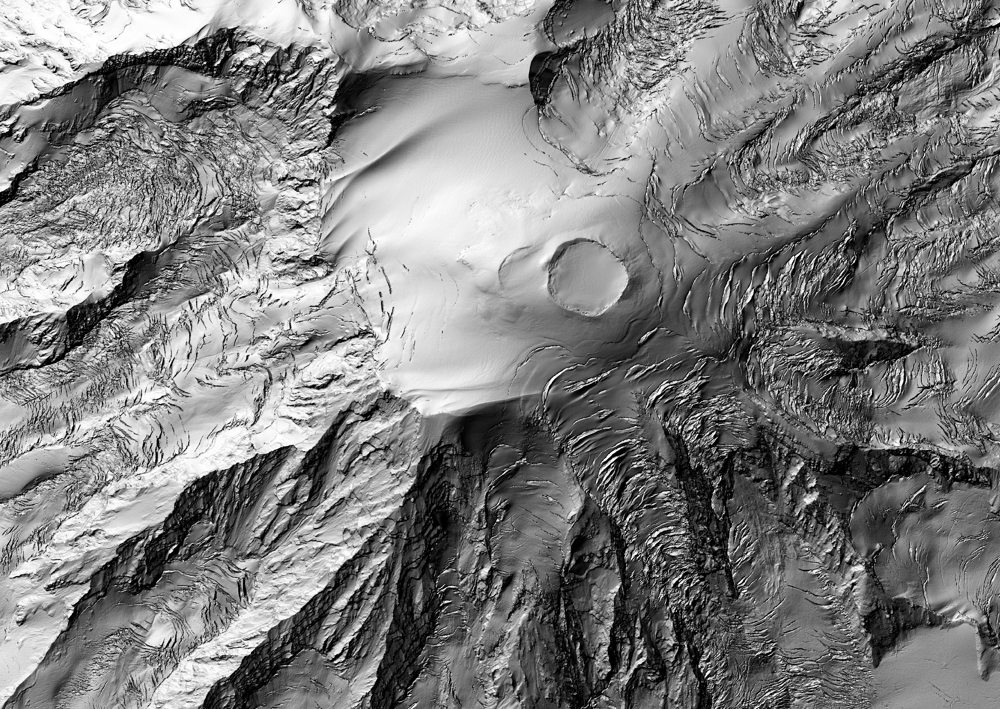

In [5]:
extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

ggplot() + theme_void() + geom_imshow(image, extent=extent)

#### Apply a Custom Palette


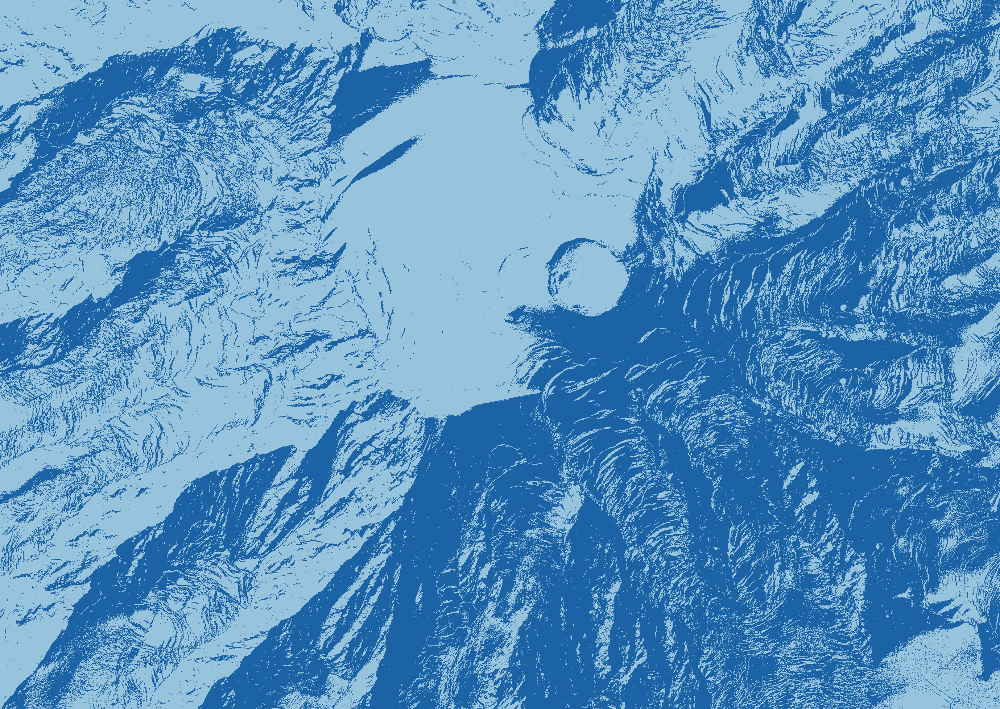

In [6]:
blue1 = '#97C3DC'
blue2 = '#1B63A5'

ggplot() + theme_void() + geom_imshow(
    image, 
    cmap=[blue2, blue1], # <-- Use palette containing just two colors
    extent=extent)

#### Generate Palette Using `scale.palette(n)` 


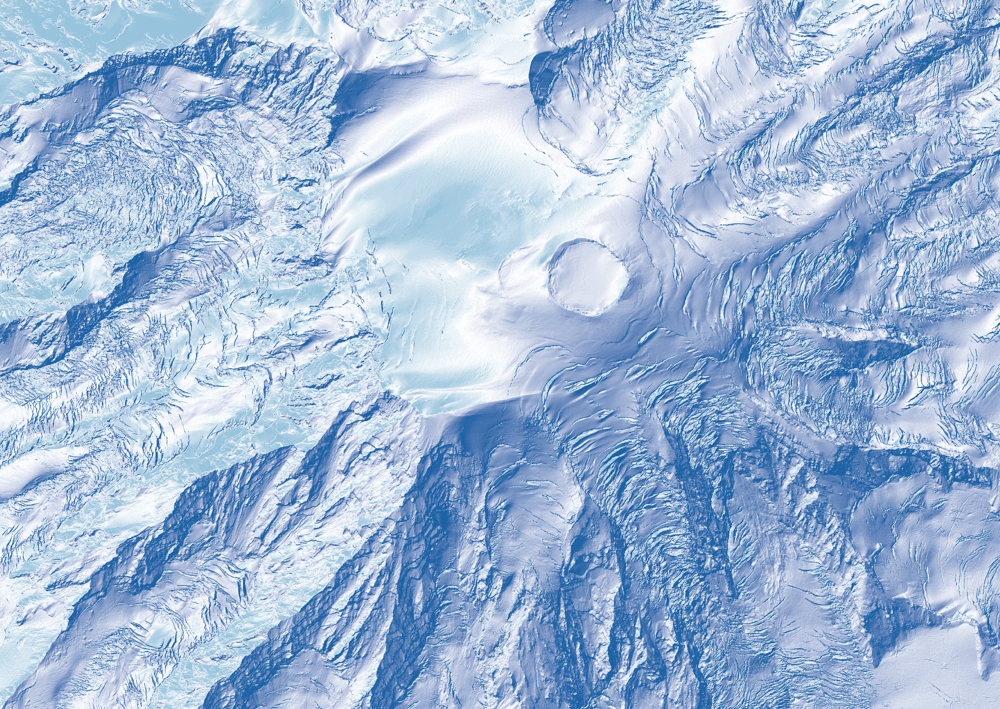

In [7]:
palette = (
    scale_color_gradient2(
        low=blue2, 
        mid='white', 
        high=blue1, 
        midpoint=0.5)       # <-- the midpoint should be in range -1..1 
    .palette(30)            # <-- generate 30 colors
)

ggplot() + theme_void() + geom_imshow(
    image, 
    cmap=palette, 
    extent=extent,
    cguide=guide_colorbar(  # <-- adjust the colorbar if needed
        title='shade',
        barwidth=8,
        barheight=300
    )
)